In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import os
from PIL import Image
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator

# Set the directories for clean and noisy images
clean_image_dir = "/content/drive/MyDrive/Data"  # Replace with the directory path of your clean images
noisy_image_dir = "/content/drive/MyDrive/noisyimages"  # Replace with the directory path of your noisy images

# Set the image dimensions and the batch size
input_shape = (252, 252, 1)
batch_size = 16

# Define the class labels
class_labels = ['adenocarcinoma', 'large.cell.carcinoma', 'normal', 'squamous.cell.carcinoma']

# Define the data generator for clean images
clean_data_generator = ImageDataGenerator(rescale=1.0 / 255.0)
clean_generator = clean_data_generator.flow_from_directory(
    os.path.join(clean_image_dir, 'train'),
    target_size=(input_shape[0], input_shape[1]),
    color_mode="grayscale",
    classes=class_labels,
    class_mode=None,
    batch_size=batch_size,
    shuffle=False,
)

# Define the data generator for noisy images
noisy_data_generator = ImageDataGenerator(rescale=1.0 / 255.0)
noisy_generator = noisy_data_generator.flow_from_directory(
    os.path.join(noisy_image_dir, 'train'),
    target_size=(input_shape[0], input_shape[1]),
    color_mode="grayscale",
    classes=class_labels,
    class_mode=None,
    batch_size=batch_size,
    shuffle=False,
)

# Load the clean and noisy images
clean_images_train = clean_generator.next()
noisy_images_train = noisy_generator.next()

# Repeat the process for the valid set
clean_generator_valid = clean_data_generator.flow_from_directory(
    os.path.join(clean_image_dir, 'valid'),
    target_size=(input_shape[0], input_shape[1]),
    color_mode="grayscale",
    classes=class_labels,
    class_mode=None,
    batch_size=batch_size,
    shuffle=False,
)

noisy_generator_valid = noisy_data_generator.flow_from_directory(
    os.path.join(noisy_image_dir, 'valid'),
    target_size=(input_shape[0], input_shape[1]),
    color_mode="grayscale",
    classes=class_labels,
    class_mode=None,
    batch_size=batch_size,
    shuffle=False,
)

clean_images_valid = clean_generator_valid.next()
noisy_images_valid = noisy_generator_valid.next()

# Repeat the process for the test set
clean_generator_test = clean_data_generator.flow_from_directory(
    os.path.join(clean_image_dir, 'test'),
    target_size=(input_shape[0], input_shape[1]),
    color_mode="grayscale",
    classes=class_labels,
    class_mode=None,
    batch_size=batch_size,
    shuffle=False,
)

noisy_generator_test = noisy_data_generator.flow_from_directory(
    os.path.join(noisy_image_dir, 'test'),
    target_size=(input_shape[0], input_shape[1]),
    color_mode="grayscale",
    classes=class_labels,
    class_mode=None,
    batch_size=batch_size,
    shuffle=False,
)

clean_images_test = clean_generator_test.next()
noisy_images_test = noisy_generator_test.next()

Found 613 images belonging to 4 classes.
Found 613 images belonging to 4 classes.
Found 72 images belonging to 4 classes.
Found 72 images belonging to 4 classes.
Found 344 images belonging to 4 classes.
Found 315 images belonging to 4 classes.


In [3]:

# Define the autoencoder architecture
input_img = Input(shape=input_shape)
x = Conv2D(200, (3, 3), activation="relu", padding="same")(input_img)
x = MaxPooling2D((2, 2), padding="same")(x)
x = Conv2D(100, (3, 3), activation="relu", padding="same")(x)
x = MaxPooling2D((2, 2), padding="same")(x)
x = Conv2D(32, (3, 3), activation="relu", padding="same")(x)
encoded = MaxPooling2D((2, 2), padding="same")(x)

x = Conv2D(16, (3, 3), activation="relu", padding="same")(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation="relu")(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation="sigmoid", padding="same")(x)



In [4]:
# Create the autoencoder model
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer=Adam(lr=0.001), loss="mse")



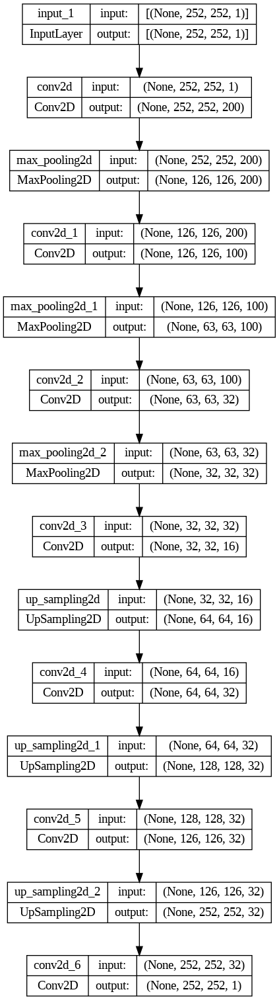

In [8]:
from tensorflow.keras.utils import plot_model

# Visualize the autoencoder model
plot_model(autoencoder, to_file='autoencoder_visualization.png', show_shapes=True)



In [9]:
import visualkeras


ModuleNotFoundError: ignored

In [6]:
!pip visualkeras

ERROR: unknown command "visualkeras"


In [5]:
import visualkeras

# Convert the autoencoder model to a visualkeras-compatible format
visual_model = visualkeras.utils.model_to_dot(autoencoder, show_shapes=True, show_layer_names=True).create(prog='dot', format='svg')

# Save the visualized model to a file
visual_model_file = 'autoencoder_visualization.svg'
visual_model.save(visual_model_file)

# Display the visualized model
visual_model


ModuleNotFoundError: ignored

In [ ]:
import matplotlib.pyplot as plt

# Train the autoencoder and obtain the history object
history = autoencoder.fit(
    noisy_images_train,
    clean_images_train,
    epochs=100,
    batch_size=batch_size,
)




Epoch 1/50
1/1 [==============================] - 15s 15s/step - loss: 0.0864
Epoch 2/50
1/1 [==============================] - 0s 125ms/step - loss: 0.0811
Epoch 3/50
1/1 [==============================] - 0s 124ms/step - loss: 0.0644
Epoch 4/50
1/1 [==============================] - 0s 125ms/step - loss: 0.0453
Epoch 5/50
1/1 [==============================] - 0s 127ms/step - loss: 0.0451
Epoch 6/50
1/1 [==============================] - 0s 122ms/step - loss: 0.0499
Epoch 7/50
1/1 [==============================] - 0s 128ms/step - loss: 0.0434
Epoch 8/50
1/1 [==============================] - 0s 124ms/step - loss: 0.0379
Epoch 9/50
1/1 [==============================] - 0s 124ms/step - loss: 0.0372
Epoch 10/50
1/1 [==============================] - 0s 124ms/step - loss: 0.0369
Epoch 11/50
1/1 [==============================] - 0s 125ms/step - loss: 0.0349
Epoch 12/50
1/1 [==============================] - 0s 123ms/step - loss: 0.0351
Epoch 13/50
1/1 [==============================] -

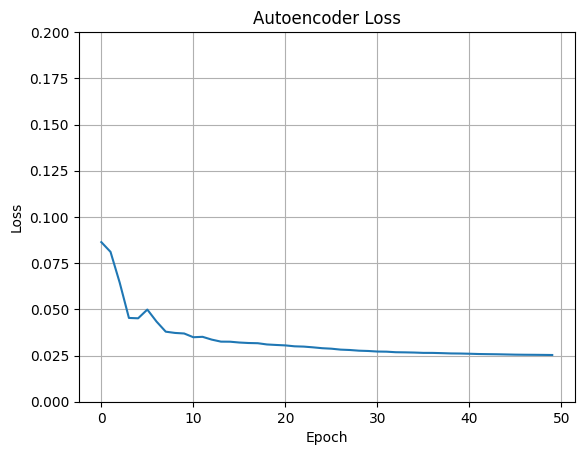

In [ ]:
# Plot the loss per epoch
plt.plot(history.history['loss'])
plt.title('Autoencoder Loss')
plt.ylim(0, 0.2)
plt.grid(True)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

In [ ]:
# Evaluate the autoencoder on test set
loss = autoencoder.evaluate(noisy_images_test, clean_images_test, batch_size=batch_size)
print("Test loss:", loss)


1/1 [==============================] - 0s 472ms/step - loss: 0.0331
Test loss: 0.03308931738138199


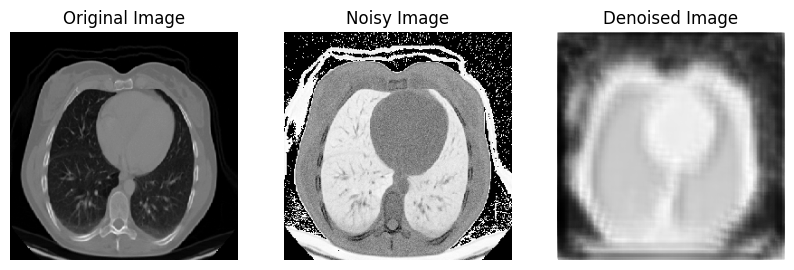

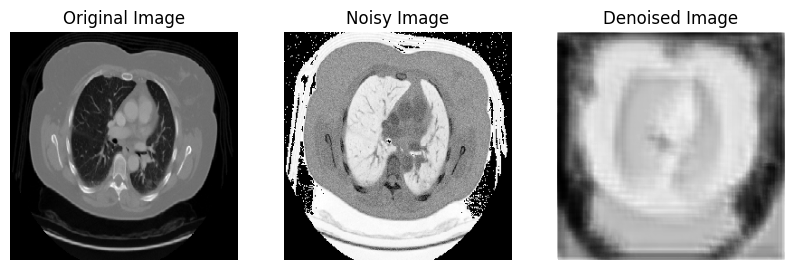

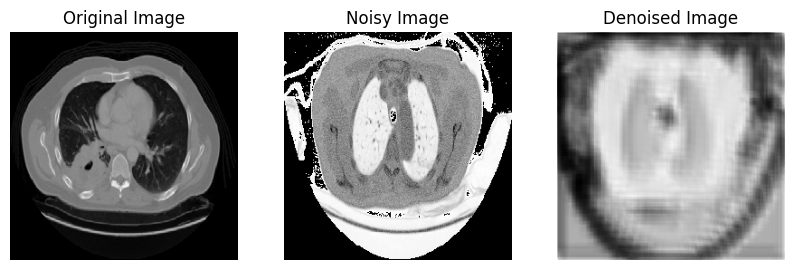

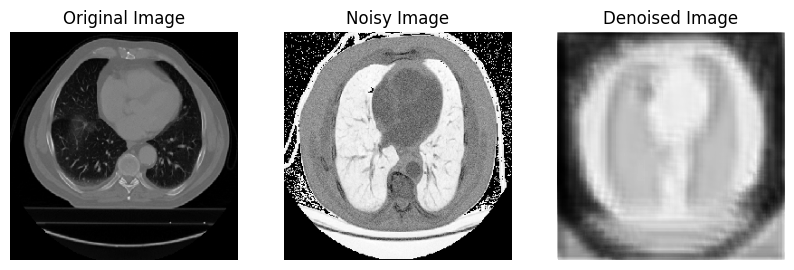

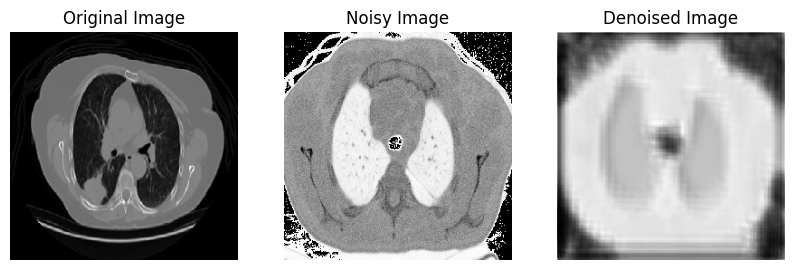

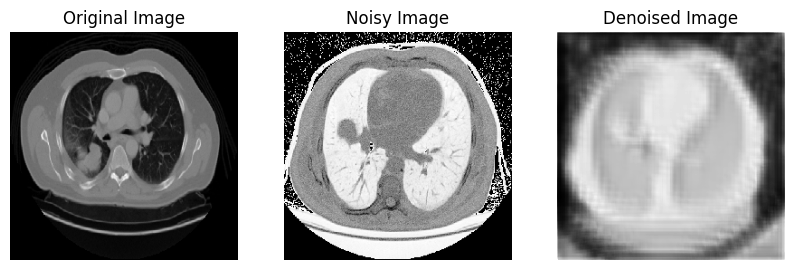

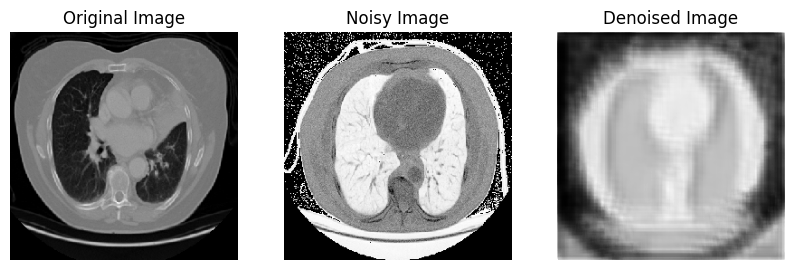

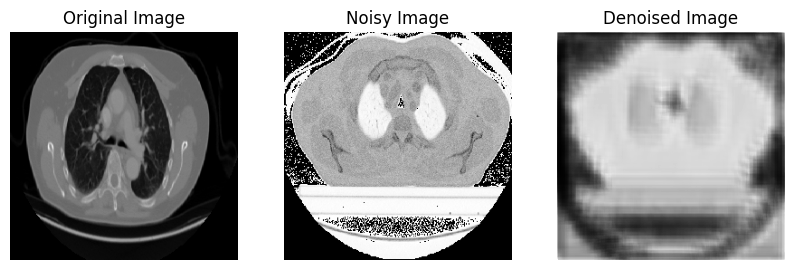

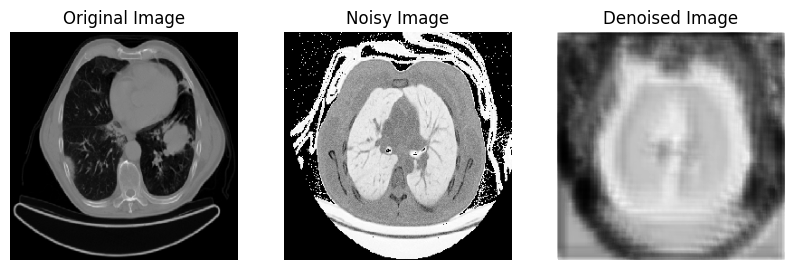

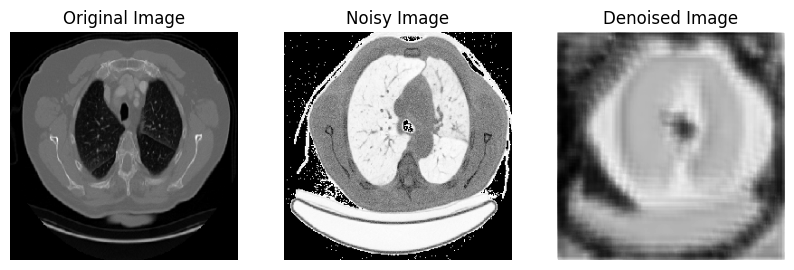

In [ ]:
# Denoise test images
denoised_images = autoencoder.predict(noisy_images_test)

import numpy as np
import matplotlib.pyplot as plt

# Display original, noisy, and denoised images
for i in range(10):
    original = np.squeeze(clean_images_test[i]) * 255.0
    noisy = np.squeeze(noisy_images_test[i]) * 255.0
    denoised = np.squeeze(denoised_images[i]) * 255.0

    # Create subplots for original, noisy, and denoised images
    fig, axs = plt.subplots(1, 3, figsize=(10, 4))

    # Display original image
    axs[0].imshow(original, cmap='gray')
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    # Display noisy image
    axs[1].imshow(noisy, cmap='gray')
    axs[1].set_title('Noisy Image')
    axs[1].axis('off')

    # Display denoised image
    axs[2].imshow(denoised, cmap='gray')
    axs[2].set_title('Denoised Image')
    axs[2].axis('off')

    plt.show()


In [ ]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D

# Define the autoencoder architecture
input_img = Input(shape=input_shape)

# Encoder
x = Conv2D(64, (3, 3), activation="relu", padding="same")(input_img)
x = MaxPooling2D((2, 2), padding="same")(x)
x = Conv2D(32, (3, 3), activation="relu", padding="same")(x)
encoded = MaxPooling2D((2, 2), padding="same")(x)

# Decoder
x = Conv2D(32, (3, 3), activation="relu", padding="same")(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation="relu", padding="same")(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation="sigmoid", padding="same")(x)

# Create the autoencoder model
autoencoder = Model(input_img, decoded)

# Compile the model
autoencoder.compile(optimizer="adam", loss="binary_crossentropy")

# Train the autoencoder
autoencoder.fit(
    noisy_images_train,
    clean_images_train,
    epochs=50,
    batch_size=batch_size,
    validation_data=(noisy_images_test, clean_images_test)
)

# Perform denoising on test images
denoised_images = autoencoder.predict(noisy_images_test)


Epoch 1/50
1/1 [==============================] - 13s 13s/step - loss: 0.7062 - val_loss: 0.6719
Epoch 2/50
1/1 [==============================] - 0s 110ms/step - loss: 0.6763 - val_loss: 0.6370
Epoch 3/50
1/1 [==============================] - 0s 112ms/step - loss: 0.6479 - val_loss: 0.5997
Epoch 4/50
1/1 [==============================] - 0s 144ms/step - loss: 0.6198 - val_loss: 0.5640
Epoch 5/50
1/1 [==============================] - 0s 105ms/step - loss: 0.5968 - val_loss: 0.5440
Epoch 6/50
1/1 [==============================] - 0s 108ms/step - loss: 0.5947 - val_loss: 0.5454
Epoch 7/50
1/1 [==============================] - 0s 108ms/step - loss: 0.6092 - val_loss: 0.5415
Epoch 8/50
1/1 [==============================] - 0s 106ms/step - loss: 0.6047 - val_loss: 0.5356
Epoch 9/50
1/1 [==============================] - 0s 144ms/step - loss: 0.5924 - val_loss: 0.5344
Epoch 10/50
1/1 [==============================] - 0s 114ms/step - loss: 0.5850 - val_loss: 0.5367
Epoch 11/50
1/1 [===

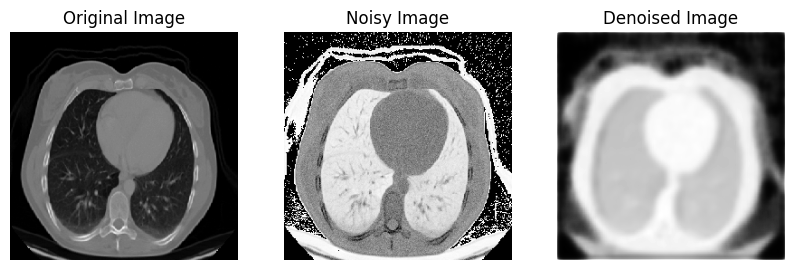

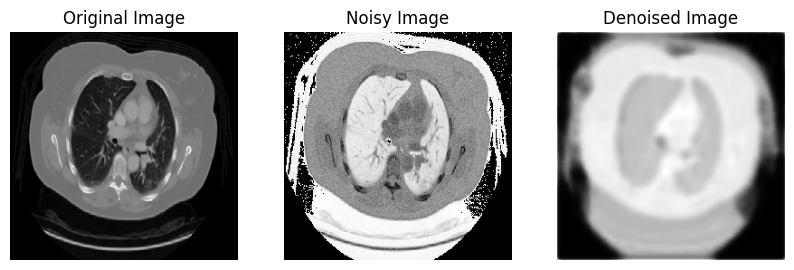

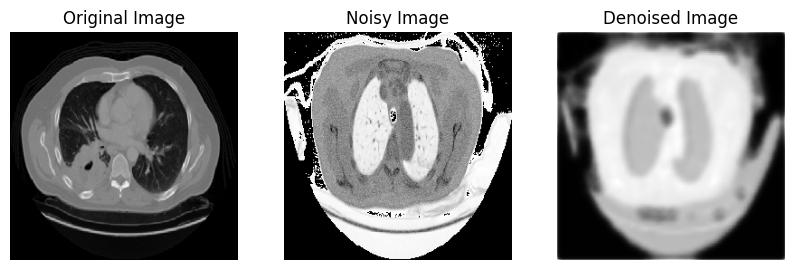

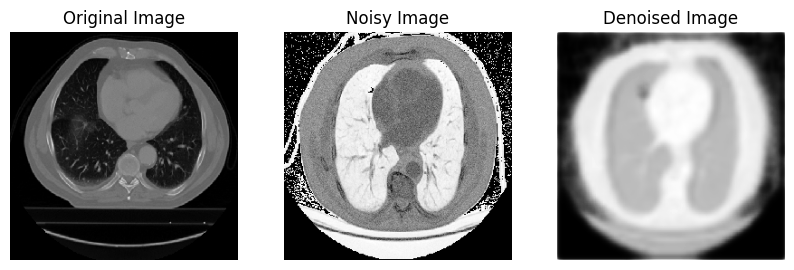

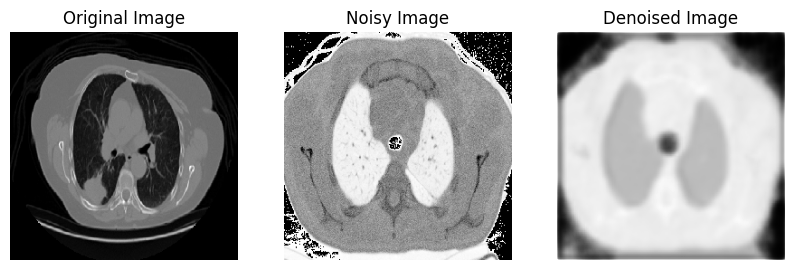

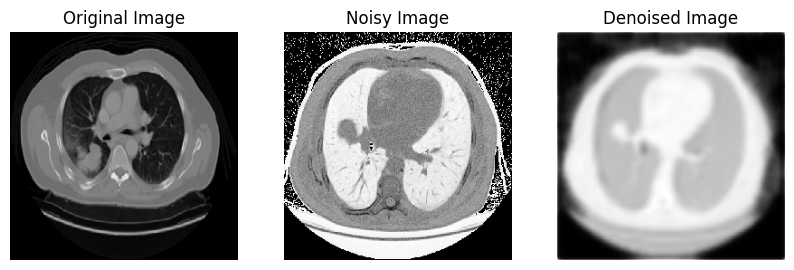

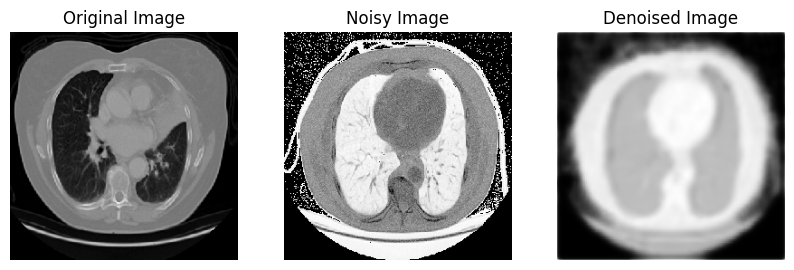

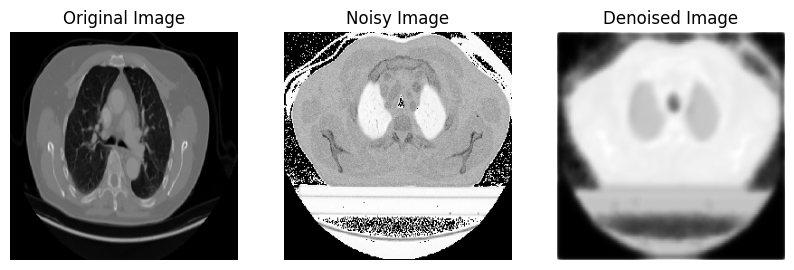

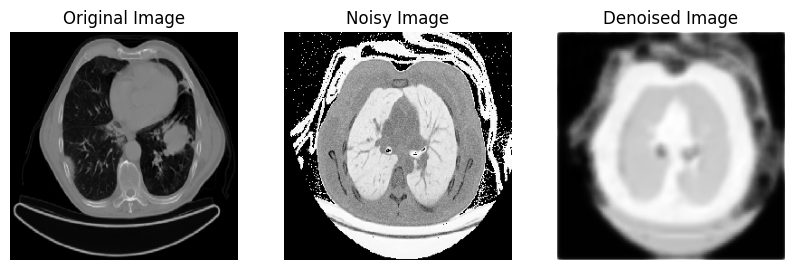

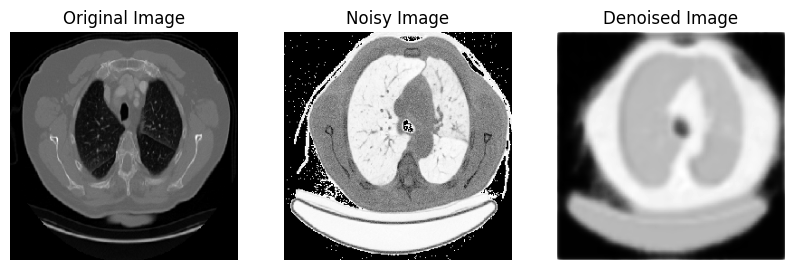

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Display original, noisy, and denoised images
for i in range(10):
    original = np.squeeze(clean_images_test[i]) * 255.0
    noisy = np.squeeze(noisy_images_test[i]) * 255.0
    denoised = np.squeeze(denoised_images[i]) * 255.0

    # Create subplots for original, noisy, and denoised images
    fig, axs = plt.subplots(1, 3, figsize=(10, 4))

    # Display original image
    axs[0].imshow(original, cmap='gray')
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    # Display noisy image
    axs[1].imshow(noisy, cmap='gray')
    axs[1].set_title('Noisy Image')
    axs[1].axis('off')

    # Display denoised image
    axs[2].imshow(denoised, cmap='gray')
    axs[2].set_title('Denoised Image')
    axs[2].axis('off')

    plt.show()


In [ ]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D

# Define the autoencoder architecture
input_img = Input(shape=input_shape)

# Encoder
x = Conv2D(64, (3, 3), activation="relu", padding="same")(input_img)
x = MaxPooling2D((2, 2), padding="same")(x)
x = Conv2D(32, (3, 3), activation="relu", padding="same")(x)
encoded = MaxPooling2D((2, 2), padding="same")(x)

# Decoder
x = Conv2D(32, (3, 3), activation="relu", padding="same")(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation="relu", padding="same")(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation="linear", padding="same")(x)

# Create the autoencoder model
autoencoder = Model(input_img, decoded)

# Compile the model
autoencoder.compile(optimizer="adam", loss="mse")

# Train the autoencoder
autoencoder.fit(
    noisy_images_train,
    clean_images_train,
    epochs=50,
    batch_size=batch_size,
    validation_data=(noisy_images_test, clean_images_test)
)

# Perform denoising on test images
denoised_images = autoencoder.predict(noisy_images_test)


Epoch 1/50
1/1 [==============================] - 2s 2s/step - loss: 0.0912 - val_loss: 0.0468
Epoch 2/50
1/1 [==============================] - 0s 150ms/step - loss: 0.0501 - val_loss: 0.0879
Epoch 3/50
1/1 [==============================] - 0s 129ms/step - loss: 0.0735 - val_loss: 0.0584
Epoch 4/50
1/1 [==============================] - 0s 112ms/step - loss: 0.0524 - val_loss: 0.0416
Epoch 5/50
1/1 [==============================] - 0s 106ms/step - loss: 0.0449 - val_loss: 0.0403
Epoch 6/50
1/1 [==============================] - 0s 106ms/step - loss: 0.0494 - val_loss: 0.0413
Epoch 7/50
1/1 [==============================] - 0s 144ms/step - loss: 0.0520 - val_loss: 0.0402
Epoch 8/50
1/1 [==============================] - 0s 147ms/step - loss: 0.0499 - val_loss: 0.0383
Epoch 9/50
1/1 [==============================] - 0s 117ms/step - loss: 0.0456 - val_loss: 0.0373
Epoch 10/50
1/1 [==============================] - 0s 107ms/step - loss: 0.0415 - val_loss: 0.0387
Epoch 11/50
1/1 [=====

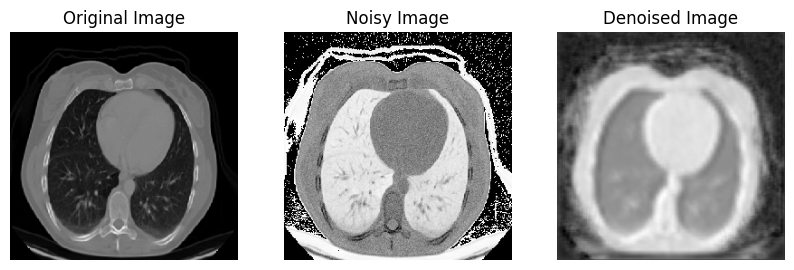

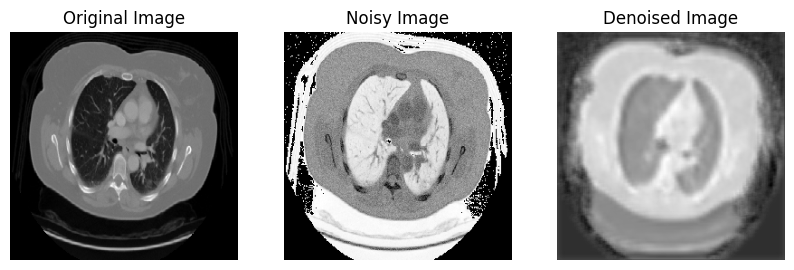

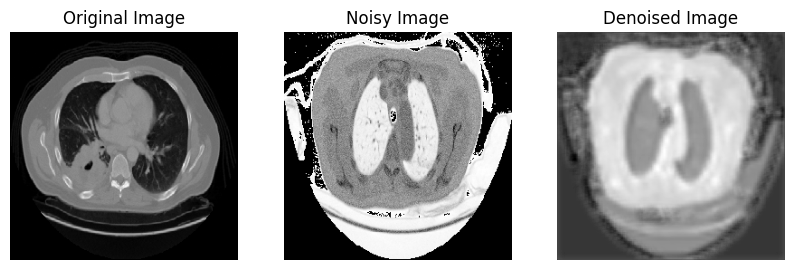

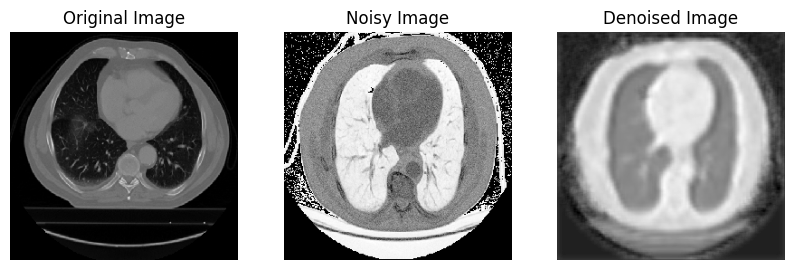

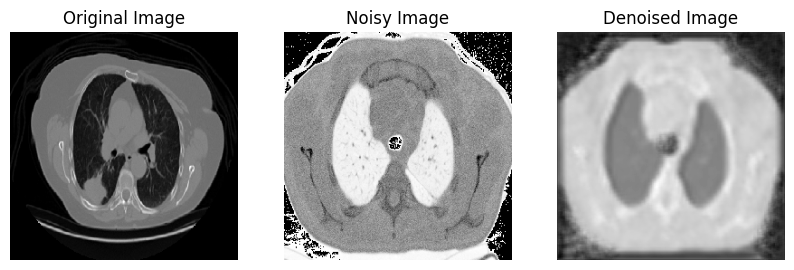

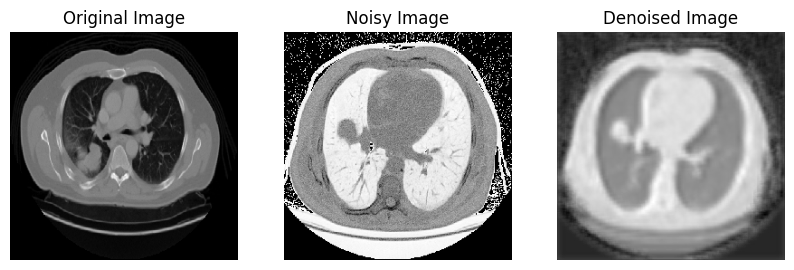

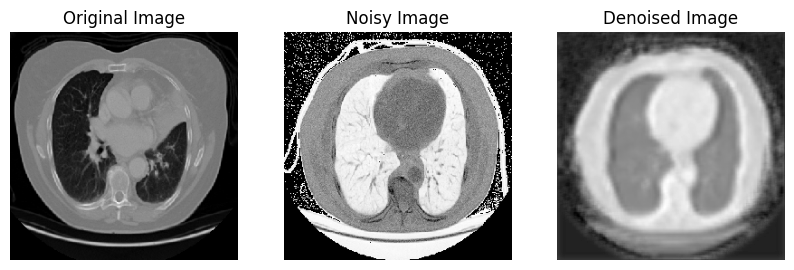

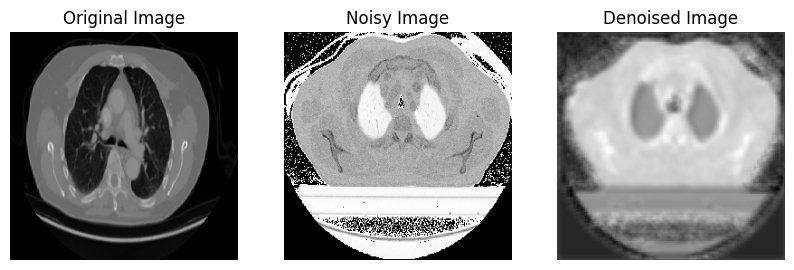

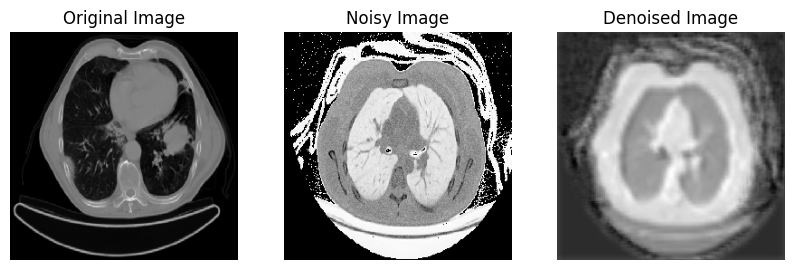

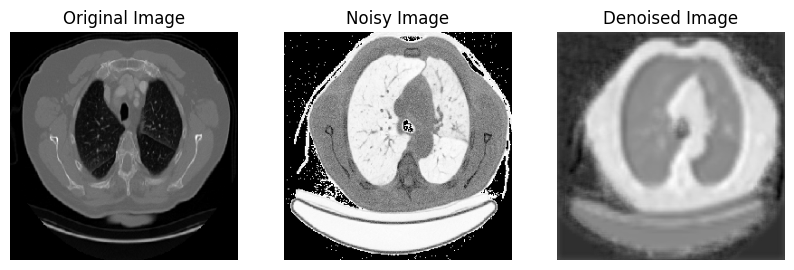

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Display original, noisy, and denoised images
for i in range(10):
    original = np.squeeze(clean_images_test[i]) * 255.0
    noisy = np.squeeze(noisy_images_test[i]) * 255.0
    denoised = np.squeeze(denoised_images[i]) * 255.0

    # Create subplots for original, noisy, and denoised images
    fig, axs = plt.subplots(1, 3, figsize=(10, 4))

    # Display original image
    axs[0].imshow(original, cmap='gray')
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    # Display noisy image
    axs[1].imshow(noisy, cmap='gray')
    axs[1].set_title('Noisy Image')
    axs[1].axis('off')

    # Display denoised image
    axs[2].imshow(denoised, cmap='gray')
    axs[2].set_title('Denoised Image')
    axs[2].axis('off')

    plt.show()


In [ ]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from keras.layers import LeakyReLU

# Define the autoencoder architecture
input_img = Input(shape=input_shape)

# Encoder
x = Conv2D(64, (3, 3), padding="same")(input_img)
x = LeakyReLU()(x)
x = MaxPooling2D((2, 2), padding="same")(x)
x = Conv2D(32, (3, 3), padding="same")(x)
x = LeakyReLU()(x)
encoded = MaxPooling2D((2, 2), padding="same")(x)

# Decoder
x = Conv2D(32, (3, 3), padding="same")(encoded)
x = LeakyReLU()(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), padding="same")(x)
x = LeakyReLU()(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation="linear", padding="same")(x)

# Create the autoencoder model
autoencoder = Model(input_img, decoded)

# Compile the model
autoencoder.compile(optimizer="adam", loss="mse")

# Train the autoencoder
autoencoder.fit(
    noisy_images_train,
    clean_images_train,
    epochs=100,
    batch_size=batch_size,
    validation_data=(noisy_images_test, clean_images_test)
)

# Perform denoising on test images
denoised_images = autoencoder.predict(noisy_images_test)


Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 0.1552 - val_loss: 0.0497
Epoch 2/100
1/1 [==============================] - 0s 128ms/step - loss: 0.0664 - val_loss: 0.0511
Epoch 3/100
1/1 [==============================] - 0s 128ms/step - loss: 0.0484 - val_loss: 0.0721
Epoch 4/100
1/1 [==============================] - 0s 128ms/step - loss: 0.0621 - val_loss: 0.0468
Epoch 5/100
1/1 [==============================] - 0s 124ms/step - loss: 0.0456 - val_loss: 0.0452
Epoch 6/100
1/1 [==============================] - 0s 127ms/step - loss: 0.0584 - val_loss: 0.0402
Epoch 7/100
1/1 [==============================] - 0s 126ms/step - loss: 0.0480 - val_loss: 0.0425
Epoch 8/100
1/1 [==============================] - 0s 134ms/step - loss: 0.0427 - val_loss: 0.0514
Epoch 9/100
1/1 [==============================] - 0s 128ms/step - loss: 0.0468 - val_loss: 0.0507
Epoch 10/100
1/1 [==============================] - 0s 127ms/step - loss: 0.0462 - val_loss: 0.0422
Epoch 11/100

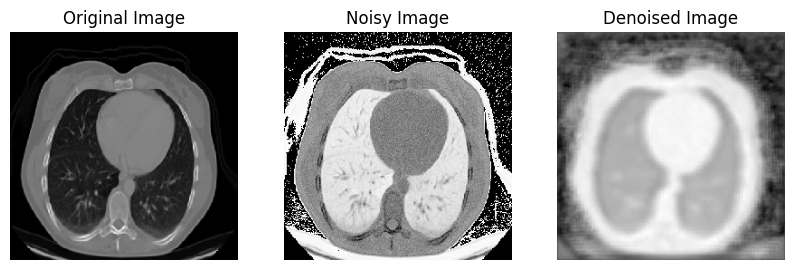

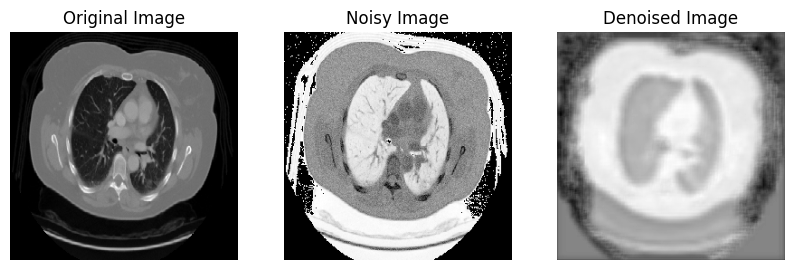

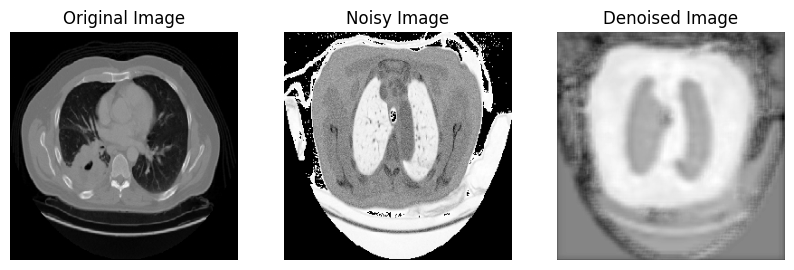

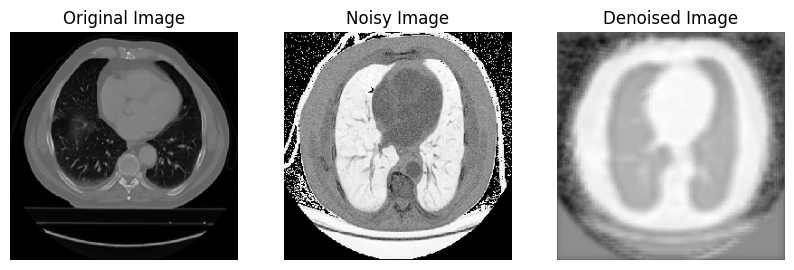

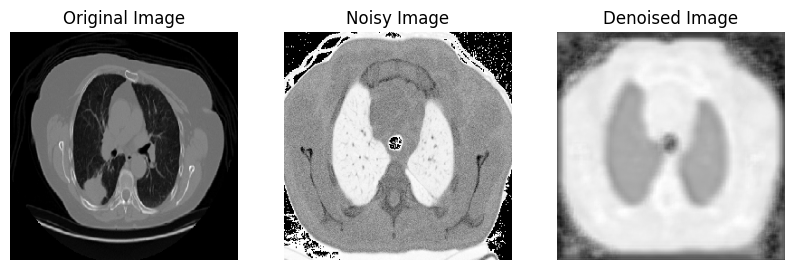

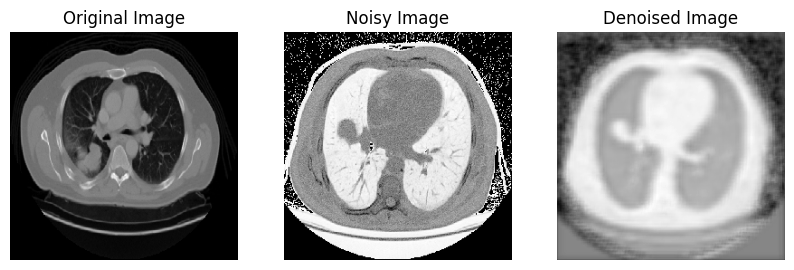

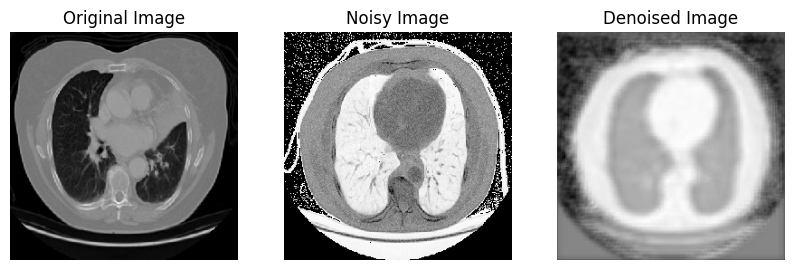

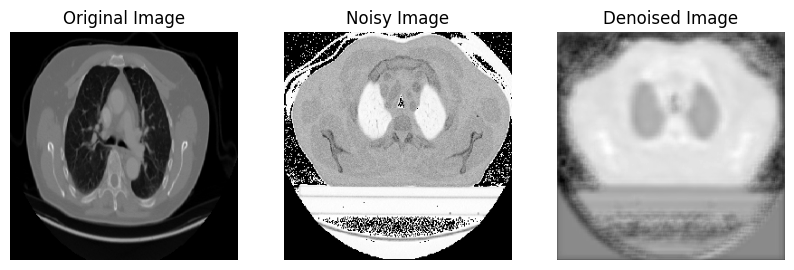

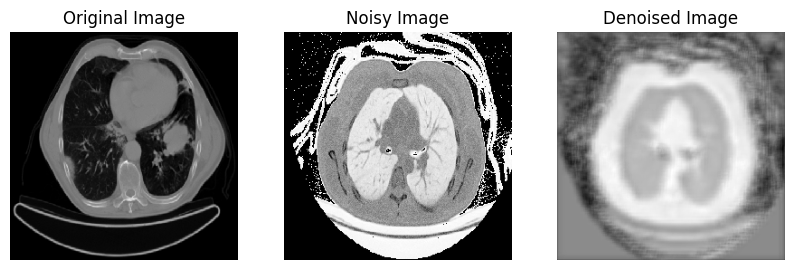

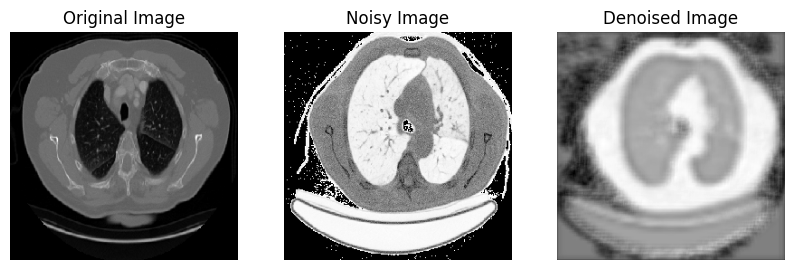

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Display original, noisy, and denoised images
for i in range(10):
    original = np.squeeze(clean_images_test[i]) * 255.0
    noisy = np.squeeze(noisy_images_test[i]) * 255.0
    denoised = np.squeeze(denoised_images[i]) * 255.0

    # Create subplots for original, noisy, and denoised images
    fig, axs = plt.subplots(1, 3, figsize=(10, 4))

    # Display original image
    axs[0].imshow(original, cmap='gray')
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    # Display noisy image
    axs[1].imshow(noisy, cmap='gray')
    axs[1].set_title('Noisy Image')
    axs[1].axis('off')

    # Display denoised image
    axs[2].imshow(denoised, cmap='gray')
    axs[2].set_title('Denoised Image')
    axs[2].axis('off')

    plt.show()


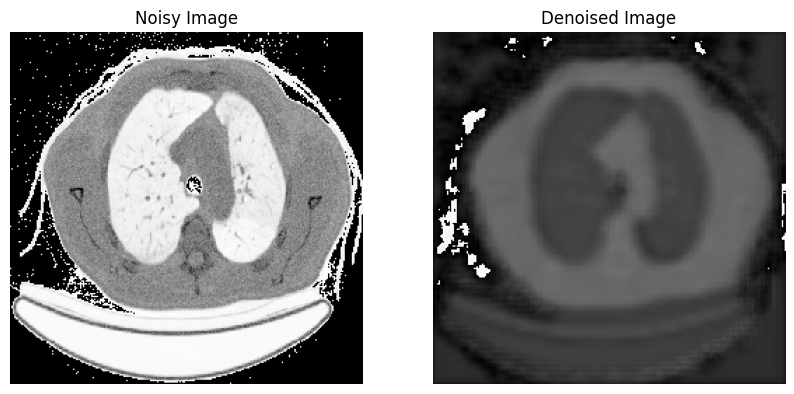

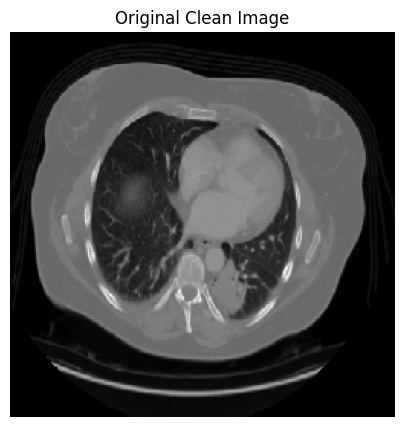

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Select a random test image
index = np.random.randint(0, len(clean_images_test))
noisy_image = noisy_images_test[index]
clean_image = clean_images_test[index]
denoised_image = denoised_images[index]

# Rescale pixel values to 0-255
noisy_image = (noisy_image * 255).astype(np.uint8)
clean_image = (clean_image * 255).astype(np.uint8)
denoised_image = (denoised_image * 255).astype(np.uint8)

# Display the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(noisy_image, cmap='gray')
axes[0].set_title('Noisy Image')
axes[0].axis('off')
axes[1].imshow(denoised_image, cmap='gray')
axes[1].set_title('Denoised Image')
axes[1].axis('off')
plt.show()

# Display the original clean image
plt.figure(figsize=(5, 5))
plt.imshow(clean_image, cmap='gray')
plt.title('Original Clean Image')
plt.axis('off')
plt.show()


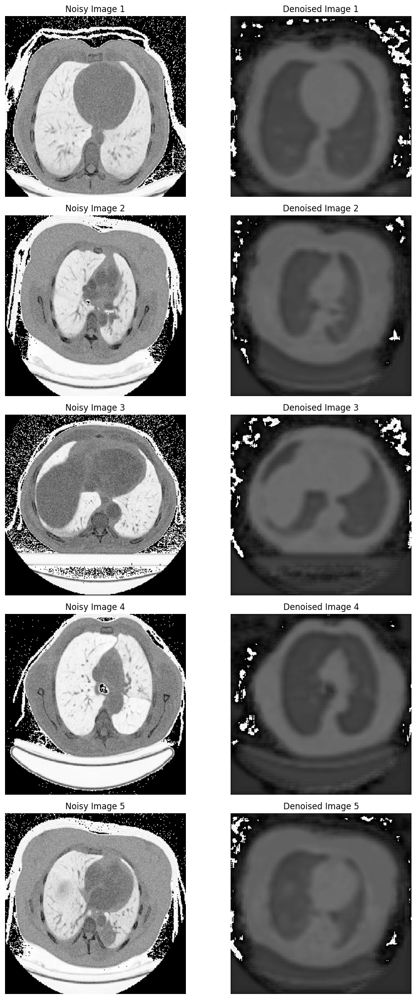

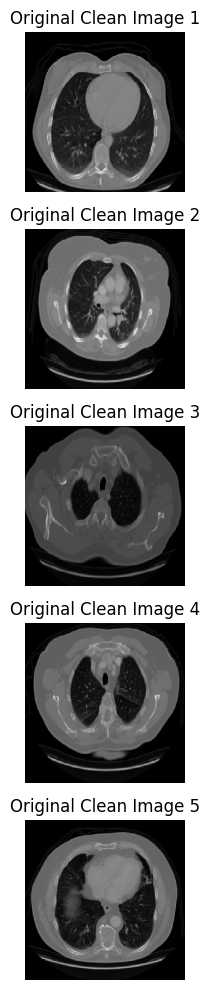

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate reconstruction errors for all test images
reconstruction_errors = np.mean(np.square(clean_images_test - denoised_images), axis=(1, 2, 3))

# Get indices of top 5 images with lowest reconstruction errors
top_indices = np.argsort(reconstruction_errors)[:5]

# Display the top 5 images with their originals
fig, axes = plt.subplots(5, 2, figsize=(10, 20))
for i, index in enumerate(top_indices):
    noisy_image = (noisy_images_test[index] * 255).astype(np.uint8)
    clean_image = (clean_images_test[index] * 255).astype(np.uint8)
    denoised_image = (denoised_images[index] * 255).astype(np.uint8)

    axes[i, 0].imshow(noisy_image, cmap='gray')
    axes[i, 0].set_title(f'Noisy Image {i+1}')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(denoised_image, cmap='gray')
    axes[i, 1].set_title(f'Denoised Image {i+1}')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

# Display the original clean images corresponding to the top 5 images
fig, axes = plt.subplots(5, 1, figsize=(5, 10))
for i, index in enumerate(top_indices):
    clean_image = (clean_images_test[index] * 255).astype(np.uint8)

    axes[i].imshow(clean_image, cmap='gray')
    axes[i].set_title(f'Original Clean Image {i+1}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()


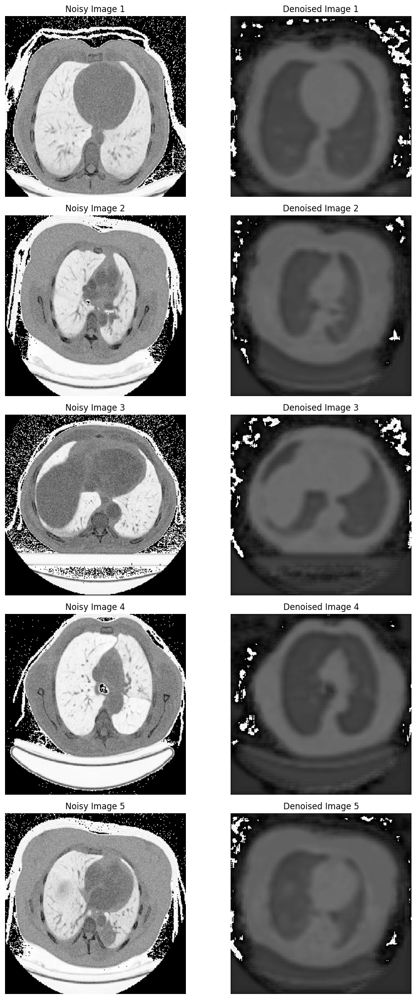

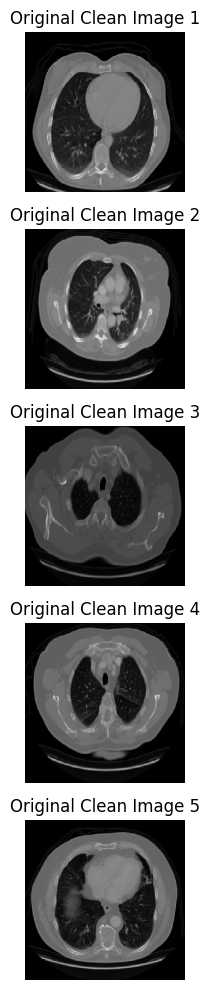

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate reconstruction errors for all test images
reconstruction_errors = np.mean(np.square(clean_images_test - denoised_images), axis=(1, 2, 3))

# Get indices of top 5 images with lowest reconstruction errors
top_indices = np.argsort(reconstruction_errors)[:5]

# Display the top 5 images with their originals
fig, axes = plt.subplots(5, 2, figsize=(10, 20))
for i, index in enumerate(top_indices):
    noisy_image = (noisy_images_test[index] * 255).astype(np.uint8)
    clean_image = (clean_images_test[index] * 255).astype(np.uint8)
    denoised_image = (denoised_images[index] * 255).astype(np.uint8)

    axes[i, 0].imshow(noisy_image, cmap='gray')
    axes[i, 0].set_title(f'Noisy Image {i+1}')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(denoised_image, cmap='gray', vmin=0, vmax=255)
    axes[i, 1].set_title(f'Denoised Image {i+1}')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

# Display the original clean images corresponding to the top 5 images
fig, axes = plt.subplots(5, 1, figsize=(5, 10))
for i, index in enumerate(top_indices):
    clean_image = (clean_images_test[index] * 255).astype(np.uint8)

    axes[i].imshow(clean_image, cmap='gray')
    axes[i].set_title(f'Original Clean Image {i+1}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()
